In [1]:
!pip install opendatasets --upgrade --quiet

In [2]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/omkargurav/face-mask-dataset'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: maggimegan
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/omkargurav/face-mask-dataset


100%|██████████| 163M/163M [00:00<00:00, 1.17GB/s]

In [3]:
import os

DATA_DIR = '/content/face-mask-dataset/data'
print(os.listdir(DATA_DIR))

['without_mask', 'with_mask']


In [4]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [5]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [6]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [7]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [9]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

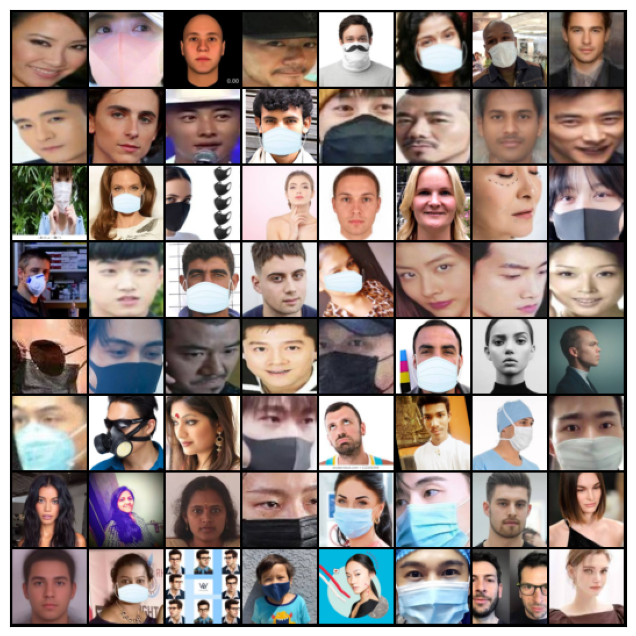

In [10]:
show_batch(train_dl)

In [11]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [12]:
device = get_default_device()
device

device(type='cuda')

In [13]:
train_dl = DeviceDataLoader(train_dl, device)

In [14]:
import torch.nn as nn

In [15]:
 discriminator = nn.Sequential(
        # Define your discriminator architecture here (same as in the notebook)
        nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),

        nn.Flatten(),
        nn.Sigmoid()
    )

In [16]:
discriminator = to_device(discriminator, device)

In [17]:
latent_size = 256

In [18]:
generator = nn.Sequential(
        # Define your generator architecture here (same as in the notebook)
        nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
        nn.BatchNorm2d(512),
        nn.ReLU(True),

        nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(256),
        nn.ReLU(True),

        nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(128),
        nn.ReLU(True),

        nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(64),
        nn.ReLU(True),

        nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
        nn.Tanh()
    )

torch.Size([128, 3, 64, 64])


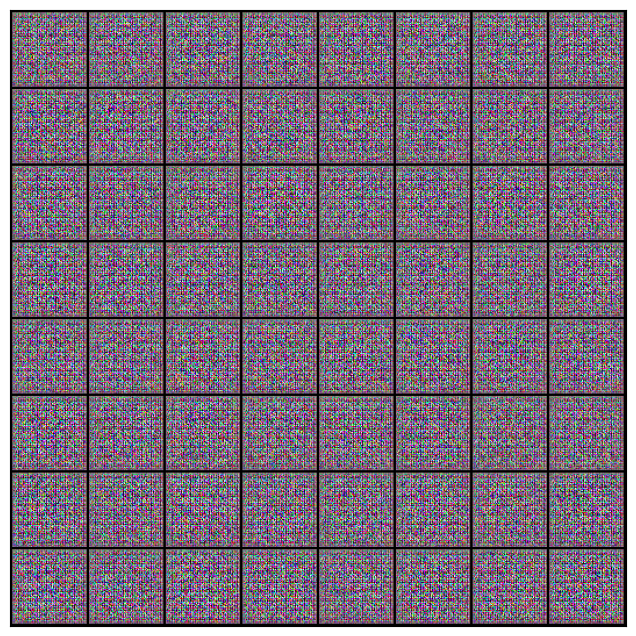

In [19]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [20]:
generator = to_device(generator, device)

In [21]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [22]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [23]:
from torchvision.utils import save_image

In [24]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [25]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [26]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


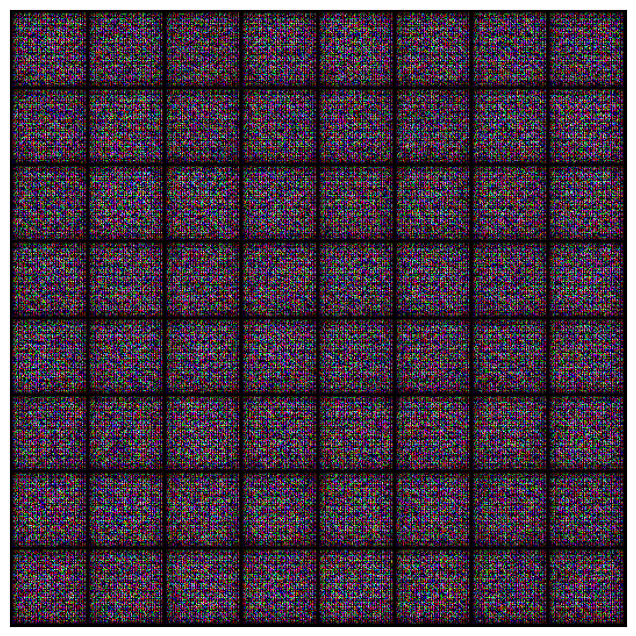

In [27]:
save_samples(0, fixed_latent)

In [28]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [29]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [37]:
lr = 0.0002
epochs = 200

In [38]:
generator.load_state_dict(torch.load('G.ckpt'))
discriminator.load_state_dict(torch.load('D.ckpt'))

<All keys matched successfully>

In [39]:
device = get_default_device()
generator = to_device(generator, device)
discriminator = to_device(discriminator, device)

In [40]:
history = fit(epochs, lr)

  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [1/200], loss_g: 5.4211, loss_d: 0.1978, real_score: 0.8630, fake_score: 0.0477
Saving generated-images-0001.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [2/200], loss_g: 1.1316, loss_d: 1.7418, real_score: 0.2446, fake_score: 0.2683
Saving generated-images-0002.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [3/200], loss_g: 4.2676, loss_d: 0.2432, real_score: 0.9831, fake_score: 0.1882
Saving generated-images-0003.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [4/200], loss_g: 3.2516, loss_d: 0.6136, real_score: 0.9367, fake_score: 0.3792
Saving generated-images-0004.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [5/200], loss_g: 3.0345, loss_d: 0.2619, real_score: 0.8678, fake_score: 0.1092
Saving generated-images-0005.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [6/200], loss_g: 1.6305, loss_d: 1.4143, real_score: 0.4533, fake_score: 0.4301
Saving generated-images-0006.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [7/200], loss_g: 7.4010, loss_d: 0.0163, real_score: 0.9961, fake_score: 0.0122
Saving generated-images-0007.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [8/200], loss_g: 4.4347, loss_d: 0.8157, real_score: 0.9257, fake_score: 0.4649
Saving generated-images-0008.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [9/200], loss_g: 5.2176, loss_d: 0.1495, real_score: 0.9975, fake_score: 0.1312
Saving generated-images-0009.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [10/200], loss_g: 0.7926, loss_d: 0.9133, real_score: 0.5906, fake_score: 0.2706
Saving generated-images-0010.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [11/200], loss_g: 0.0335, loss_d: 1.7577, real_score: 0.1957, fake_score: 0.1141
Saving generated-images-0011.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [12/200], loss_g: 2.4645, loss_d: 0.7051, real_score: 0.7168, fake_score: 0.2867
Saving generated-images-0012.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [13/200], loss_g: 0.5737, loss_d: 1.3679, real_score: 0.2717, fake_score: 0.0606
Saving generated-images-0013.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [14/200], loss_g: 5.4659, loss_d: 0.5606, real_score: 0.9932, fake_score: 0.3867
Saving generated-images-0014.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [15/200], loss_g: 1.3080, loss_d: 3.4630, real_score: 0.0315, fake_score: 0.0050
Saving generated-images-0015.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [16/200], loss_g: 5.6023, loss_d: 0.7056, real_score: 0.9880, fake_score: 0.4536
Saving generated-images-0016.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [17/200], loss_g: 1.4229, loss_d: 0.8585, real_score: 0.6212, fake_score: 0.2991
Saving generated-images-0017.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [18/200], loss_g: 0.7947, loss_d: 0.9378, real_score: 0.5532, fake_score: 0.2614
Saving generated-images-0018.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [19/200], loss_g: 4.7658, loss_d: 0.1200, real_score: 0.9911, fake_score: 0.1015
Saving generated-images-0019.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [20/200], loss_g: 0.0586, loss_d: 2.8121, real_score: 0.0683, fake_score: 0.1127
Saving generated-images-0020.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [21/200], loss_g: 0.3735, loss_d: 2.2517, real_score: 0.1556, fake_score: 0.2865
Saving generated-images-0021.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [22/200], loss_g: 0.1093, loss_d: 3.8678, real_score: 0.0268, fake_score: 0.2018
Saving generated-images-0022.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [23/200], loss_g: 0.3322, loss_d: 2.5068, real_score: 0.0949, fake_score: 0.1337
Saving generated-images-0023.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [24/200], loss_g: 3.8820, loss_d: 0.1731, real_score: 0.9490, fake_score: 0.1097
Saving generated-images-0024.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [25/200], loss_g: 3.8612, loss_d: 0.1835, real_score: 0.9236, fake_score: 0.0954
Saving generated-images-0025.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [26/200], loss_g: 0.0161, loss_d: 2.5022, real_score: 0.0867, fake_score: 0.0535
Saving generated-images-0026.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [27/200], loss_g: 0.2322, loss_d: 1.6405, real_score: 0.2748, fake_score: 0.2766
Saving generated-images-0027.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [28/200], loss_g: 3.2436, loss_d: 0.6474, real_score: 0.7620, fake_score: 0.2895
Saving generated-images-0028.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [29/200], loss_g: 0.5476, loss_d: 0.9083, real_score: 0.4202, fake_score: 0.0398
Saving generated-images-0029.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [30/200], loss_g: 0.1259, loss_d: 2.8646, real_score: 0.0677, fake_score: 0.1489
Saving generated-images-0030.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [31/200], loss_g: 0.0043, loss_d: 3.5012, real_score: 0.0345, fake_score: 0.1203
Saving generated-images-0031.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [32/200], loss_g: 1.3695, loss_d: 0.5523, real_score: 0.6737, fake_score: 0.1364
Saving generated-images-0032.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [33/200], loss_g: 3.8769, loss_d: 0.1315, real_score: 0.9897, fake_score: 0.1103
Saving generated-images-0033.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [34/200], loss_g: 4.8750, loss_d: 0.2770, real_score: 0.9848, fake_score: 0.2104
Saving generated-images-0034.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [35/200], loss_g: 1.1342, loss_d: 0.8263, real_score: 0.4916, fake_score: 0.1050
Saving generated-images-0035.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [36/200], loss_g: 0.2015, loss_d: 1.1008, real_score: 0.4258, fake_score: 0.2088
Saving generated-images-0036.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [37/200], loss_g: 1.5202, loss_d: 0.9915, real_score: 0.6703, fake_score: 0.4081
Saving generated-images-0037.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [38/200], loss_g: 0.0310, loss_d: 1.3049, real_score: 0.2960, fake_score: 0.0807
Saving generated-images-0038.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [39/200], loss_g: 0.0847, loss_d: 4.3545, real_score: 0.0142, fake_score: 0.0918
Saving generated-images-0039.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [40/200], loss_g: 1.4752, loss_d: 0.8571, real_score: 0.4413, fake_score: 0.0375
Saving generated-images-0040.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [41/200], loss_g: 0.0133, loss_d: 4.3183, real_score: 0.0166, fake_score: 0.1868
Saving generated-images-0041.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [42/200], loss_g: 3.5190, loss_d: 0.2435, real_score: 0.8760, fake_score: 0.1009
Saving generated-images-0042.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [43/200], loss_g: 0.5034, loss_d: 1.1066, real_score: 0.3698, fake_score: 0.1030
Saving generated-images-0043.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [44/200], loss_g: 0.0188, loss_d: 2.7167, real_score: 0.0740, fake_score: 0.1044
Saving generated-images-0044.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [45/200], loss_g: 0.0717, loss_d: 5.1287, real_score: 0.0068, fake_score: 0.1156
Saving generated-images-0045.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [46/200], loss_g: 0.0217, loss_d: 2.5840, real_score: 0.0886, fake_score: 0.1397
Saving generated-images-0046.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [47/200], loss_g: 4.4950, loss_d: 0.1322, real_score: 0.9948, fake_score: 0.1148
Saving generated-images-0047.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [48/200], loss_g: 0.1255, loss_d: 1.8769, real_score: 0.1670, fake_score: 0.0814
Saving generated-images-0048.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [49/200], loss_g: 4.3431, loss_d: 0.1163, real_score: 0.9910, fake_score: 0.0974
Saving generated-images-0049.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [50/200], loss_g: 0.0929, loss_d: 1.9093, real_score: 0.1652, fake_score: 0.1006
Saving generated-images-0050.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [51/200], loss_g: 3.1352, loss_d: 0.1880, real_score: 0.9710, fake_score: 0.1395
Saving generated-images-0051.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [52/200], loss_g: 0.0499, loss_d: 1.4749, real_score: 0.2669, fake_score: 0.1350
Saving generated-images-0052.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [53/200], loss_g: 2.9523, loss_d: 0.3342, real_score: 0.9846, fake_score: 0.2592
Saving generated-images-0053.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [54/200], loss_g: 2.6731, loss_d: 0.8475, real_score: 0.7952, fake_score: 0.4214
Saving generated-images-0054.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [55/200], loss_g: 3.8902, loss_d: 0.2068, real_score: 0.9446, fake_score: 0.1324
Saving generated-images-0055.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [56/200], loss_g: 0.0691, loss_d: 1.5577, real_score: 0.3315, fake_score: 0.3347
Saving generated-images-0056.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [57/200], loss_g: 0.0613, loss_d: 3.3334, real_score: 0.0432, fake_score: 0.1653
Saving generated-images-0057.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [58/200], loss_g: 0.8220, loss_d: 1.3631, real_score: 0.3050, fake_score: 0.1504
Saving generated-images-0058.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [59/200], loss_g: 0.8573, loss_d: 0.8637, real_score: 0.5196, fake_score: 0.1770
Saving generated-images-0059.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [60/200], loss_g: 3.2272, loss_d: 0.1947, real_score: 0.9987, fake_score: 0.1691
Saving generated-images-0060.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [61/200], loss_g: 0.4567, loss_d: 0.5642, real_score: 0.6238, fake_score: 0.0859
Saving generated-images-0061.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [62/200], loss_g: 3.9667, loss_d: 0.3577, real_score: 0.9634, fake_score: 0.2554
Saving generated-images-0062.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [63/200], loss_g: 1.5247, loss_d: 0.8110, real_score: 0.7065, fake_score: 0.3358
Saving generated-images-0063.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [64/200], loss_g: 0.2665, loss_d: 1.1148, real_score: 0.3979, fake_score: 0.1647
Saving generated-images-0064.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [65/200], loss_g: 3.2215, loss_d: 0.3323, real_score: 0.9860, fake_score: 0.2485
Saving generated-images-0065.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [66/200], loss_g: 0.0338, loss_d: 2.1658, real_score: 0.1273, fake_score: 0.0947
Saving generated-images-0066.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [67/200], loss_g: 2.4229, loss_d: 0.6349, real_score: 0.8304, fake_score: 0.3265
Saving generated-images-0067.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [68/200], loss_g: 3.3743, loss_d: 0.4893, real_score: 0.9620, fake_score: 0.3366
Saving generated-images-0068.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [69/200], loss_g: 3.2291, loss_d: 0.3117, real_score: 0.9904, fake_score: 0.2372
Saving generated-images-0069.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [70/200], loss_g: 0.5081, loss_d: 1.5697, real_score: 0.2150, fake_score: 0.0314
Saving generated-images-0070.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [71/200], loss_g: 0.0381, loss_d: 1.2238, real_score: 0.3692, fake_score: 0.1899
Saving generated-images-0071.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [72/200], loss_g: 3.8478, loss_d: 0.2900, real_score: 0.9851, fake_score: 0.2292
Saving generated-images-0072.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [73/200], loss_g: 2.5993, loss_d: 0.2542, real_score: 0.9248, fake_score: 0.1528
Saving generated-images-0073.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [74/200], loss_g: 2.2774, loss_d: 0.3047, real_score: 0.8615, fake_score: 0.1378
Saving generated-images-0074.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [75/200], loss_g: 0.0082, loss_d: 3.4149, real_score: 0.0396, fake_score: 0.1596
Saving generated-images-0075.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [76/200], loss_g: 0.1605, loss_d: 2.7078, real_score: 0.1184, fake_score: 0.3924
Saving generated-images-0076.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [77/200], loss_g: 0.7636, loss_d: 1.0001, real_score: 0.4290, fake_score: 0.1344
Saving generated-images-0077.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [78/200], loss_g: 1.0053, loss_d: 0.5332, real_score: 0.6735, fake_score: 0.1244
Saving generated-images-0078.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [79/200], loss_g: 0.2410, loss_d: 1.4209, real_score: 0.2799, fake_score: 0.1323
Saving generated-images-0079.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [80/200], loss_g: 0.2258, loss_d: 3.5985, real_score: 0.0316, fake_score: 0.1291
Saving generated-images-0080.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [81/200], loss_g: 0.0742, loss_d: 2.1395, real_score: 0.1464, fake_score: 0.1857
Saving generated-images-0081.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [82/200], loss_g: 0.8637, loss_d: 0.5555, real_score: 0.7002, fake_score: 0.1715
Saving generated-images-0082.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [83/200], loss_g: 0.9504, loss_d: 0.6307, real_score: 0.6314, fake_score: 0.1488
Saving generated-images-0083.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [84/200], loss_g: 0.0931, loss_d: 2.1636, real_score: 0.1287, fake_score: 0.1042
Saving generated-images-0084.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [85/200], loss_g: 1.9494, loss_d: 0.3671, real_score: 0.8602, fake_score: 0.1812
Saving generated-images-0085.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [86/200], loss_g: 0.3038, loss_d: 0.7718, real_score: 0.5239, fake_score: 0.1114
Saving generated-images-0086.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [87/200], loss_g: 0.0082, loss_d: 1.1848, real_score: 0.3486, fake_score: 0.1174
Saving generated-images-0087.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [88/200], loss_g: 3.5988, loss_d: 0.2592, real_score: 0.9145, fake_score: 0.1459
Saving generated-images-0088.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [89/200], loss_g: 0.0515, loss_d: 1.9669, real_score: 0.1569, fake_score: 0.1045
Saving generated-images-0089.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [90/200], loss_g: 4.0029, loss_d: 0.3930, real_score: 0.9997, fake_score: 0.2982
Saving generated-images-0090.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [91/200], loss_g: 0.9712, loss_d: 0.6333, real_score: 0.6822, fake_score: 0.2080
Saving generated-images-0091.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [92/200], loss_g: 3.2633, loss_d: 0.1864, real_score: 0.9724, fake_score: 0.1413
Saving generated-images-0092.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [93/200], loss_g: 0.0574, loss_d: 1.4734, real_score: 0.2482, fake_score: 0.0740
Saving generated-images-0093.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [94/200], loss_g: 0.2230, loss_d: 2.7322, real_score: 0.0682, fake_score: 0.0446
Saving generated-images-0094.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [95/200], loss_g: 4.3020, loss_d: 0.1214, real_score: 0.9990, fake_score: 0.1070
Saving generated-images-0095.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [96/200], loss_g: 0.1576, loss_d: 1.6039, real_score: 0.2332, fake_score: 0.1310
Saving generated-images-0096.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [97/200], loss_g: 3.7685, loss_d: 0.2787, real_score: 0.9884, fake_score: 0.2156
Saving generated-images-0097.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [98/200], loss_g: 4.1151, loss_d: 0.1141, real_score: 0.9755, fake_score: 0.0830
Saving generated-images-0098.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [99/200], loss_g: 2.0992, loss_d: 0.6502, real_score: 0.7052, fake_score: 0.2388
Saving generated-images-0099.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [100/200], loss_g: 0.6406, loss_d: 0.6068, real_score: 0.6109, fake_score: 0.0971
Saving generated-images-0100.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [101/200], loss_g: 0.3129, loss_d: 1.1831, real_score: 0.3239, fake_score: 0.0524
Saving generated-images-0101.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [102/200], loss_g: 2.4262, loss_d: 0.3699, real_score: 0.8116, fake_score: 0.1412
Saving generated-images-0102.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [103/200], loss_g: 0.1286, loss_d: 1.0011, real_score: 0.3929, fake_score: 0.0629
Saving generated-images-0103.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [104/200], loss_g: 0.5456, loss_d: 0.6955, real_score: 0.5635, fake_score: 0.1092
Saving generated-images-0104.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [105/200], loss_g: 3.5530, loss_d: 0.1118, real_score: 0.9582, fake_score: 0.0646
Saving generated-images-0105.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [106/200], loss_g: 0.0306, loss_d: 4.5972, real_score: 0.0110, fake_score: 0.0805
Saving generated-images-0106.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [107/200], loss_g: 0.7014, loss_d: 1.7702, real_score: 0.2067, fake_score: 0.1655
Saving generated-images-0107.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [108/200], loss_g: 0.0591, loss_d: 1.7562, real_score: 0.2015, fake_score: 0.1349
Saving generated-images-0108.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [109/200], loss_g: 1.7787, loss_d: 0.6649, real_score: 0.6817, fake_score: 0.2298
Saving generated-images-0109.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [110/200], loss_g: 3.2137, loss_d: 0.3533, real_score: 0.9671, fake_score: 0.2538
Saving generated-images-0110.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [111/200], loss_g: 0.0608, loss_d: 1.9180, real_score: 0.2167, fake_score: 0.2993
Saving generated-images-0111.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [112/200], loss_g: 0.0220, loss_d: 5.1153, real_score: 0.0068, fake_score: 0.1065
Saving generated-images-0112.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [113/200], loss_g: 0.1163, loss_d: 3.6560, real_score: 0.0312, fake_score: 0.1621
Saving generated-images-0113.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [114/200], loss_g: 4.7116, loss_d: 0.1059, real_score: 1.0000, fake_score: 0.0960
Saving generated-images-0114.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [115/200], loss_g: 2.7890, loss_d: 0.2033, real_score: 0.9128, fake_score: 0.1023
Saving generated-images-0115.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [116/200], loss_g: 3.4014, loss_d: 0.1530, real_score: 0.9891, fake_score: 0.1269
Saving generated-images-0116.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [117/200], loss_g: 1.2466, loss_d: 0.3404, real_score: 0.8068, fake_score: 0.1129
Saving generated-images-0117.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [118/200], loss_g: 0.0120, loss_d: 1.6174, real_score: 0.2073, fake_score: 0.0420
Saving generated-images-0118.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [119/200], loss_g: 0.0925, loss_d: 1.8210, real_score: 0.1825, fake_score: 0.1058
Saving generated-images-0119.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [120/200], loss_g: 3.8047, loss_d: 0.1049, real_score: 1.0000, fake_score: 0.0947
Saving generated-images-0120.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [121/200], loss_g: 0.9044, loss_d: 0.7350, real_score: 0.5595, fake_score: 0.1315
Saving generated-images-0121.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [122/200], loss_g: 1.0103, loss_d: 0.5848, real_score: 0.7073, fake_score: 0.1987
Saving generated-images-0122.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [123/200], loss_g: 0.4263, loss_d: 0.7822, real_score: 0.4881, fake_score: 0.0614
Saving generated-images-0123.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [124/200], loss_g: 3.1764, loss_d: 0.4996, real_score: 0.9861, fake_score: 0.3490
Saving generated-images-0124.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [125/200], loss_g: 0.2424, loss_d: 0.9536, real_score: 0.4166, fake_score: 0.0718
Saving generated-images-0125.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [126/200], loss_g: 0.0618, loss_d: 3.8570, real_score: 0.0235, fake_score: 0.0948
Saving generated-images-0126.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [127/200], loss_g: 0.0829, loss_d: 1.2488, real_score: 0.3265, fake_score: 0.1133
Saving generated-images-0127.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [128/200], loss_g: 0.5591, loss_d: 1.8235, real_score: 0.1724, fake_score: 0.0612
Saving generated-images-0128.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [129/200], loss_g: 0.2835, loss_d: 1.0554, real_score: 0.4269, fake_score: 0.1745
Saving generated-images-0129.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [130/200], loss_g: 0.4919, loss_d: 0.7434, real_score: 0.5300, fake_score: 0.0996
Saving generated-images-0130.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [131/200], loss_g: 0.3096, loss_d: 0.8609, real_score: 0.4796, fake_score: 0.1132
Saving generated-images-0131.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [132/200], loss_g: 1.4817, loss_d: 0.3298, real_score: 0.8264, fake_score: 0.1243
Saving generated-images-0132.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [133/200], loss_g: 4.0133, loss_d: 0.1751, real_score: 0.9995, fake_score: 0.1530
Saving generated-images-0133.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [134/200], loss_g: 1.0574, loss_d: 0.4923, real_score: 0.6306, fake_score: 0.0302
Saving generated-images-0134.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [135/200], loss_g: 0.8102, loss_d: 0.6359, real_score: 0.6144, fake_score: 0.1303
Saving generated-images-0135.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [136/200], loss_g: 0.0365, loss_d: 2.0973, real_score: 0.1401, fake_score: 0.1161
Saving generated-images-0136.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [137/200], loss_g: 0.1023, loss_d: 3.7027, real_score: 0.0290, fake_score: 0.1390
Saving generated-images-0137.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [138/200], loss_g: 0.5917, loss_d: 1.3624, real_score: 0.2879, fake_score: 0.1045
Saving generated-images-0138.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [139/200], loss_g: 3.5467, loss_d: 0.2360, real_score: 0.9569, fake_score: 0.1627
Saving generated-images-0139.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [140/200], loss_g: 0.0479, loss_d: 3.0404, real_score: 0.0544, fake_score: 0.1120
Saving generated-images-0140.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [141/200], loss_g: 2.7910, loss_d: 0.4504, real_score: 0.9063, fake_score: 0.2655
Saving generated-images-0141.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [142/200], loss_g: 4.2181, loss_d: 0.1660, real_score: 0.9939, fake_score: 0.1393
Saving generated-images-0142.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [143/200], loss_g: 0.1910, loss_d: 1.2689, real_score: 0.2913, fake_score: 0.0344
Saving generated-images-0143.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [144/200], loss_g: 0.0713, loss_d: 3.9633, real_score: 0.0208, fake_score: 0.0823
Saving generated-images-0144.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [145/200], loss_g: 4.8353, loss_d: 0.1058, real_score: 0.9973, fake_score: 0.0925
Saving generated-images-0145.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [146/200], loss_g: 1.0192, loss_d: 0.4042, real_score: 0.7210, fake_score: 0.0715
Saving generated-images-0146.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [147/200], loss_g: 0.0131, loss_d: 1.2599, real_score: 0.2958, fake_score: 0.0390
Saving generated-images-0147.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [148/200], loss_g: 3.6036, loss_d: 0.3150, real_score: 0.8754, fake_score: 0.1511
Saving generated-images-0148.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [149/200], loss_g: 4.4975, loss_d: 0.1323, real_score: 0.9925, fake_score: 0.1101
Saving generated-images-0149.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [150/200], loss_g: 0.4419, loss_d: 0.8011, real_score: 0.4818, fake_score: 0.0665
Saving generated-images-0150.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [151/200], loss_g: 0.0787, loss_d: 3.9086, real_score: 0.0220, fake_score: 0.0764
Saving generated-images-0151.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [152/200], loss_g: 0.1972, loss_d: 5.4946, real_score: 0.0049, fake_score: 0.1486
Saving generated-images-0152.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [153/200], loss_g: 1.9798, loss_d: 0.4241, real_score: 0.7269, fake_score: 0.0964
Saving generated-images-0153.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [154/200], loss_g: 0.0202, loss_d: 5.5614, real_score: 0.0043, fake_score: 0.1052
Saving generated-images-0154.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [155/200], loss_g: 0.2525, loss_d: 2.3385, real_score: 0.1020, fake_score: 0.0518
Saving generated-images-0155.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [156/200], loss_g: 0.0756, loss_d: 4.5270, real_score: 0.0130, fake_score: 0.1559
Saving generated-images-0156.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [157/200], loss_g: 3.8303, loss_d: 0.1108, real_score: 0.9832, fake_score: 0.0856
Saving generated-images-0157.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [158/200], loss_g: 3.5078, loss_d: 0.1472, real_score: 0.9208, fake_score: 0.0600
Saving generated-images-0158.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [159/200], loss_g: 0.1718, loss_d: 2.3353, real_score: 0.1014, fake_score: 0.0444
Saving generated-images-0159.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [160/200], loss_g: 2.1805, loss_d: 0.2861, real_score: 0.8309, fake_score: 0.0912
Saving generated-images-0160.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [161/200], loss_g: 0.0993, loss_d: 5.9898, real_score: 0.0027, fake_score: 0.0759
Saving generated-images-0161.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [162/200], loss_g: 0.2936, loss_d: 1.5484, real_score: 0.2259, fake_score: 0.0565
Saving generated-images-0162.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [163/200], loss_g: 0.6492, loss_d: 0.7394, real_score: 0.5773, fake_score: 0.1619
Saving generated-images-0163.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [164/200], loss_g: 3.9911, loss_d: 0.1303, real_score: 0.9215, fake_score: 0.0461
Saving generated-images-0164.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [165/200], loss_g: 0.3084, loss_d: 0.9019, real_score: 0.4412, fake_score: 0.0774
Saving generated-images-0165.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [166/200], loss_g: 4.1576, loss_d: 0.1200, real_score: 0.9629, fake_score: 0.0762
Saving generated-images-0166.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [167/200], loss_g: 0.4006, loss_d: 0.7183, real_score: 0.5060, fake_score: 0.0354
Saving generated-images-0167.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [168/200], loss_g: 0.1819, loss_d: 2.3825, real_score: 0.1071, fake_score: 0.1286
Saving generated-images-0168.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [169/200], loss_g: 0.0842, loss_d: 1.4766, real_score: 0.2692, fake_score: 0.1411
Saving generated-images-0169.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [170/200], loss_g: 4.0597, loss_d: 0.1205, real_score: 0.9999, fake_score: 0.1069
Saving generated-images-0170.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [171/200], loss_g: 0.2741, loss_d: 1.1554, real_score: 0.4175, fake_score: 0.2217
Saving generated-images-0171.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [172/200], loss_g: 0.3150, loss_d: 3.3427, real_score: 0.0365, fake_score: 0.0304
Saving generated-images-0172.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [173/200], loss_g: 0.3666, loss_d: 0.7672, real_score: 0.5154, fake_score: 0.0890
Saving generated-images-0173.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [174/200], loss_g: 0.4479, loss_d: 1.0023, real_score: 0.4237, fake_score: 0.1225
Saving generated-images-0174.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [175/200], loss_g: 4.8287, loss_d: 0.0716, real_score: 0.9849, fake_score: 0.0523
Saving generated-images-0175.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [176/200], loss_g: 2.9383, loss_d: 0.2068, real_score: 0.8459, fake_score: 0.0375
Saving generated-images-0176.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [177/200], loss_g: 0.1170, loss_d: 4.6528, real_score: 0.0097, fake_score: 0.0194
Saving generated-images-0177.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [178/200], loss_g: 0.0976, loss_d: 2.0048, real_score: 0.1417, fake_score: 0.0481
Saving generated-images-0178.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [179/200], loss_g: 0.1313, loss_d: 2.2172, real_score: 0.1319, fake_score: 0.1553
Saving generated-images-0179.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [180/200], loss_g: 0.0188, loss_d: 3.2367, real_score: 0.0458, fake_score: 0.1338
Saving generated-images-0180.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [181/200], loss_g: 1.8678, loss_d: 0.4379, real_score: 0.7855, fake_score: 0.1648
Saving generated-images-0181.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [182/200], loss_g: 0.9623, loss_d: 0.5820, real_score: 0.6952, fake_score: 0.1813
Saving generated-images-0182.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [183/200], loss_g: 3.4516, loss_d: 0.2272, real_score: 0.9952, fake_score: 0.1847
Saving generated-images-0183.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [184/200], loss_g: 0.2090, loss_d: 3.5076, real_score: 0.0315, fake_score: 0.0479
Saving generated-images-0184.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [185/200], loss_g: 0.1152, loss_d: 2.0864, real_score: 0.1360, fake_score: 0.0837
Saving generated-images-0185.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [186/200], loss_g: 2.0884, loss_d: 0.4881, real_score: 0.6517, fake_score: 0.0560
Saving generated-images-0186.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [187/200], loss_g: 3.5639, loss_d: 0.1026, real_score: 0.9985, fake_score: 0.0917
Saving generated-images-0187.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [188/200], loss_g: 3.4349, loss_d: 0.1649, real_score: 0.9627, fake_score: 0.1028
Saving generated-images-0188.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [189/200], loss_g: 4.9897, loss_d: 0.0664, real_score: 0.9778, fake_score: 0.0416
Saving generated-images-0189.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [190/200], loss_g: 3.5856, loss_d: 0.1906, real_score: 0.8805, fake_score: 0.0589
Saving generated-images-0190.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [191/200], loss_g: 1.0821, loss_d: 1.3458, real_score: 0.3096, fake_score: 0.1460
Saving generated-images-0191.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [192/200], loss_g: 0.0991, loss_d: 2.9181, real_score: 0.0584, fake_score: 0.0730
Saving generated-images-0192.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [193/200], loss_g: 2.3590, loss_d: 0.3959, real_score: 0.7260, fake_score: 0.0701
Saving generated-images-0193.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [194/200], loss_g: 0.2410, loss_d: 2.2424, real_score: 0.1112, fake_score: 0.0433
Saving generated-images-0194.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [195/200], loss_g: 4.1834, loss_d: 0.7464, real_score: 0.9777, fake_score: 0.4444
Saving generated-images-0195.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [196/200], loss_g: 4.5868, loss_d: 0.0893, real_score: 0.9849, fake_score: 0.0683
Saving generated-images-0196.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [197/200], loss_g: 2.3023, loss_d: 0.2779, real_score: 0.8052, fake_score: 0.0574
Saving generated-images-0197.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [198/200], loss_g: 0.0235, loss_d: 3.0820, real_score: 0.0486, fake_score: 0.0539
Saving generated-images-0198.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [199/200], loss_g: 0.8929, loss_d: 0.9551, real_score: 0.4039, fake_score: 0.0453
Saving generated-images-0199.png


  0%|          | 0/60 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [200/200], loss_g: 0.8218, loss_d: 0.5041, real_score: 0.6392, fake_score: 0.0529
Saving generated-images-0200.png


In [41]:
losses_g, losses_d, real_scores, fake_scores = history

In [42]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.ckpt')
torch.save(discriminator.state_dict(), 'D.ckpt')

In [43]:
from IPython.display import Image

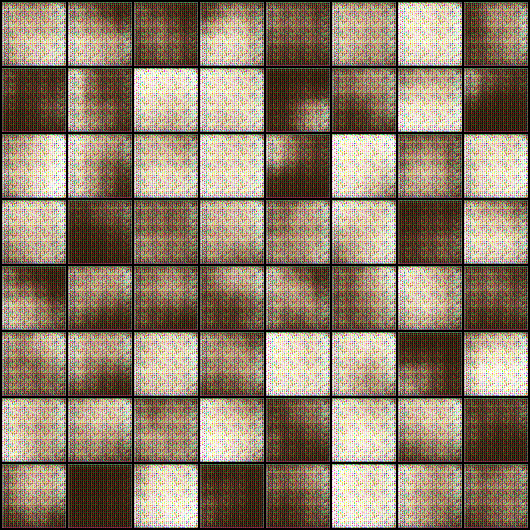

In [44]:
Image('./generated/generated-images-0001.png')

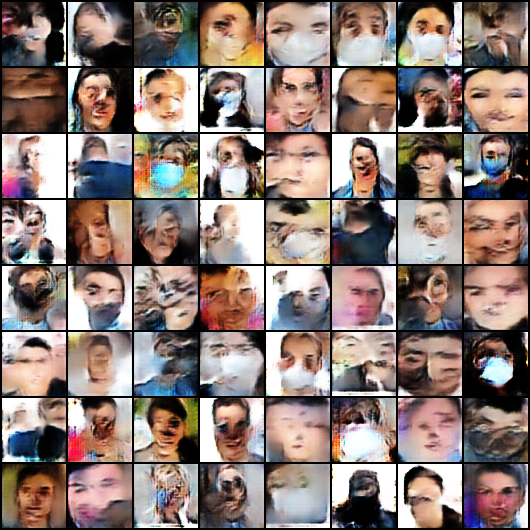

In [56]:
Image('/content/generated/generated-images-0050.png')

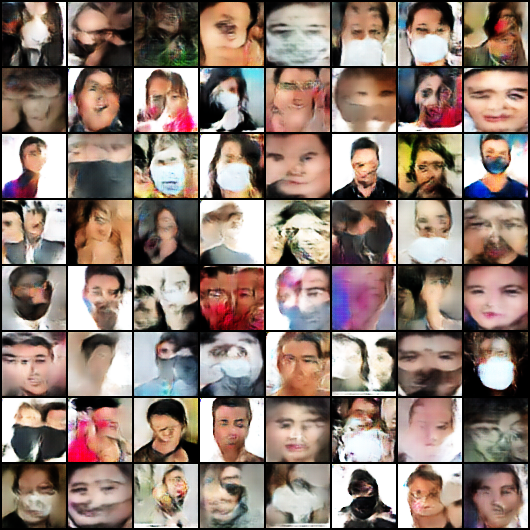

In [54]:
Image('/content/generated/generated-images-0100.png')

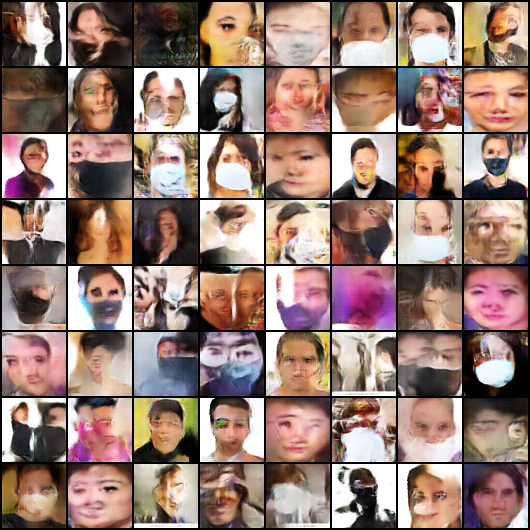

In [52]:
Image('/content/generated/generated-images-0150.png')

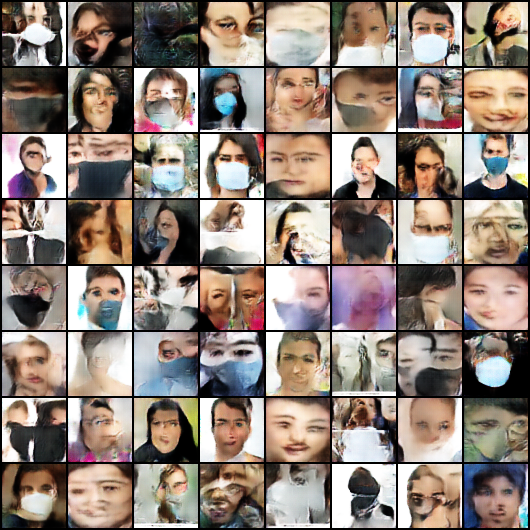

In [53]:
Image('/content/generated/generated-images-0199.png')

In [49]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

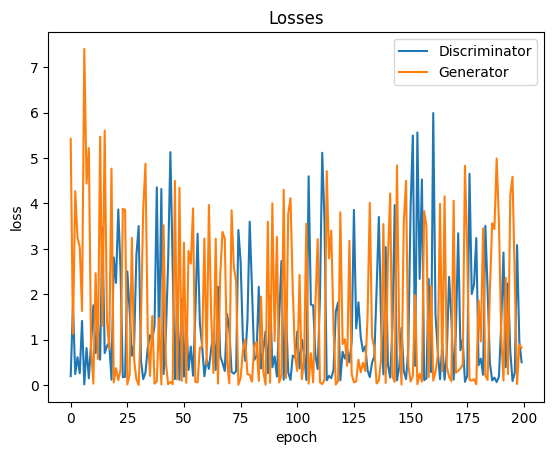

In [50]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

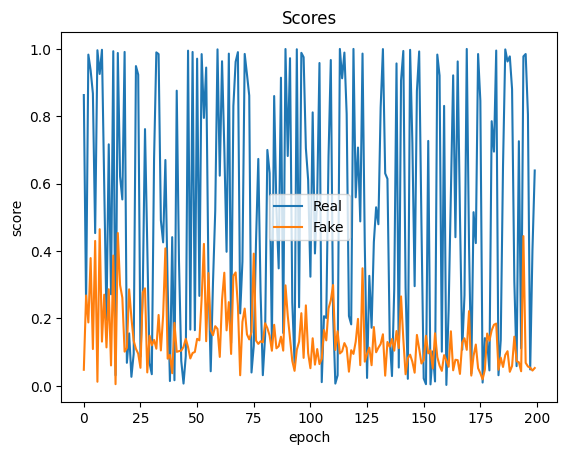

In [51]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');